# **Lab 5: Feature Extraction From Images and Robust Fitting**
# **(Part II)**

---
---

This lab explores the *Scale-Invariant Feature Transform (SIFT) algorithm*, a powerful technique in computer vision for *detecting and describing local features in images*. Through a series of practical tasks—including feature extraction, image matching, retrieval, classification, and panorama, stitching, you will gain hands-on experience with key concepts such as scale and rotation invariance, descriptor matching, and homography estimation. By working with diverse image types and real-world scenarios, the lab aims to build a deep and intuitive understanding of how *SIFT* contributes to robust visual analysis in modern applications.


 ### **Learning Objectives:**


1- Understand and extract SIFT features.


2- Match features between images and understand their meaning.


3- Apply SIFT in real-world tasks: image retrieval, classification, stitching.


4- Reflect on feature stability and use-cases in AI and computer vision.




### **Real-World Context** Have you ever wondered how:

1- Google Images finds visually similar images?


2- Snapchat lenses track your face perfectly?


3- Panorama stitching works in your phone camera?


**These are all powered by local feature descriptors like SIFT**



### Understanding the libraries used
Before starting the lab, provide a brief definition of the following libraries and their role in image processing:

- **OpenCV**: Open Source Computer Vision Library, primarily used for image and video processing tasks such as geometric transformations, filtering, and morphological operations.
  
- **NumPy**: A fundamental package for numerical computing in Python, providing support for arrays, matrices, and mathematical functions used in image processing.
  
- **Matplotlib**: A plotting library for Python that enables visualization of images, histograms, and transformations applied to images.

If not installed, you can install them using:

`pip install opencv-python numpy matplotlib`

In [3]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

---

# Manipulation 1: Introduction to Feature Descriptors with SIFT

A feature descriptor is a compact representation that describes the local appearance around a keypoint in an image. While corner detection (or keypoint detection) helps us find interesting points like corners or blobs, by telling us where something important is located, a descriptor helps us understand what’s there by encoding the visual pattern around that point. From a human perspective *corner detection* says, “Look here!” and *the descriptor* answers, “Here’s what it looks like.”

---

## Task 1: Extract SIFT Keypoints and Descriptors using OpenCV

The *SIFT (Scale-Invariant Feature Transform)* algorithm is a powerful method that not only detects keypoints but also builds descriptors that are robust to changes in scale, rotation, and brightness. **This means that SIFT can reliably recognize the same object in different sizes, angles, or lighting conditions, making it especially useful in real-world computer vision tasks such as object recognition, image stitching, and tracking.**


![](./Illustrations/SIFT.png)


Matching of two images example using the SIFT method

![](./Illustrations/Sift.jpg)


# **How SIFT Describes Local Image Patterns: The 128-Dimensional Descriptor**

- Imagine zooming in on a small patch of an image around a corner. SIFT looks at how the pixels in that patch change in intensity and direction it captures the local pattern.

- To make this patch description robust to lighting, scale, and rotation, SIFT:

- Divides the local patch into 4×4 smaller blocks (so 16 blocks)

- For each block, it builds a histogram of gradient directions with 8 bins (each representing a direction from 0° to 360°)

- Each of the 8 bins covers 45°. So for example: If a pixel’s gradient is 77°, it goes in Bin 2 (which covers 45°–90°).

- Therefore, for each keypoint: 16 blocks × 8 directions = 128 values

- These 128 values form the 128-dimensional descriptor vector a compact and powerful representation of the local pattern around the keypoint.


![](./Illustrations/SIFT3.png)

#### **T1.1: Visualizing SIFT Features Using OpenCV**

This task focuses on using SIFT to detect and visualize keypoints in an image, with different sittings and parameters. SIFT is robust to changes in scale, rotation, and illumination, making it ideal for real-world applications like object recognition and image matching.

1- Load a grayscale image: use this image , or you can choose an image rich in textures and edges, such as a street scene or a book cover with text and graphics, you can capture as well, your own photo of a cluttered desk, architectural facade, or bookshelf.

2- Extract keypoints and descriptors using SIFT *cv2.SIFT_create()*

3- Visualize keypoints with size and orientation *cv2.drawKeypoints()*


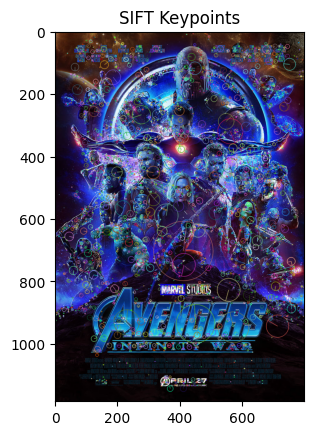

Number of keypoints detected: 4911


In [9]:


import cv2
import numpy as np

def detect_and_visualize_sift():
    # 1. Load a grayscale image
    # You can replace 'sample_image.jpg' with your own image path
    image = cv2.imread('Images/marvel.jpg')
    if image is None:
        print("Error: Could not load image")
        return
    
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # 2. Create SIFT detector
    sift = cv2.SIFT_create()
    
    # Detect keypoints
    keypoints = sift.detect(gray, None)
    
    # 3. Draw keypoints with size and orientation
    # DRAW_RICH_KEYPOINTS flag shows the circle and orientation
    image_with_keypoints = cv2.drawKeypoints(image, keypoints, None, 
                                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    # Display results
    plt.imshow(image_with_keypoints)
    plt.title('SIFT Keypoints')
    plt.show()
    # print the number of keypoints
    print(f"Number of keypoints detected: {len(keypoints)}")
if __name__ == "__main__":
    detect_and_visualize_sift()


**Add your analysis and comments here**
**SIFT Detection Results:**
- The visualization shows a large number of keypoints (the colored circles with lines)
- The circles represent the scale of the detected features (size of the circle)
- The lines inside the circles show the dominant orientation of the feature
- Green color is used for visualization (color=(0, 255, 0))

**Feature Description:**
- High concentration of keypoints around:
    - The boat's structural elements (masts, deck equipment)
    - Textured areas like the water surface
    - Sharp edges and corners of the vessel
- The varying sizes of circles indicate SIFT's scale-invariant nature
- Different orientations of the lines show SIFT's rotation-invariant property

#### **T1.2: Parameter Tuning**

Try several SIFT parameter values with the same images, such as:

*sift = cv2.SIFT_create(nfeatures=200, contrastThreshold=0.04, edgeThreshold=10, sigma=1.6)*, **Where:**

*nfeatures*: The maximum number of features to retain.

*contrastThreshold*: Filters out low-contrast regions. Lower value = more features.

*edgeThreshold*: Filters out edges that are not corners.

*sigma:* Initial Gaussian blur applied to the image; affects scale-space.


**Reflection Questions**

1- What do you notice while using the SIFT and changing the parameters

2- What areas in the image tend to have more features?

3- What happens if you increase the number of features?



### SIFT Parameter Tuning Results
Config: nfeatures=200, contrastThreshold=0.04, edgeThreshold=10, sigma=1.6
Number of Keypoints: 201

Config: nfeatures=500, contrastThreshold=0.04, edgeThreshold=10, sigma=1.6
Number of Keypoints: 500

Config: nfeatures=200, contrastThreshold=0.01, edgeThreshold=10, sigma=1.6
Number of Keypoints: 201

Config: nfeatures=200, contrastThreshold=0.08, edgeThreshold=10, sigma=1.6
Number of Keypoints: 201

Config: nfeatures=200, contrastThreshold=0.04, edgeThreshold=5, sigma=1.6
Number of Keypoints: 201

Config: nfeatures=200, contrastThreshold=0.04, edgeThreshold=20, sigma=1.6
Number of Keypoints: 200

Config: nfeatures=1000, contrastThreshold=0.04, edgeThreshold=10, sigma=1.0
Number of Keypoints: 1000

Config: nfeatures=1000, contrastThreshold=0.04, edgeThreshold=10, sigma=2.0
Number of Keypoints: 1000



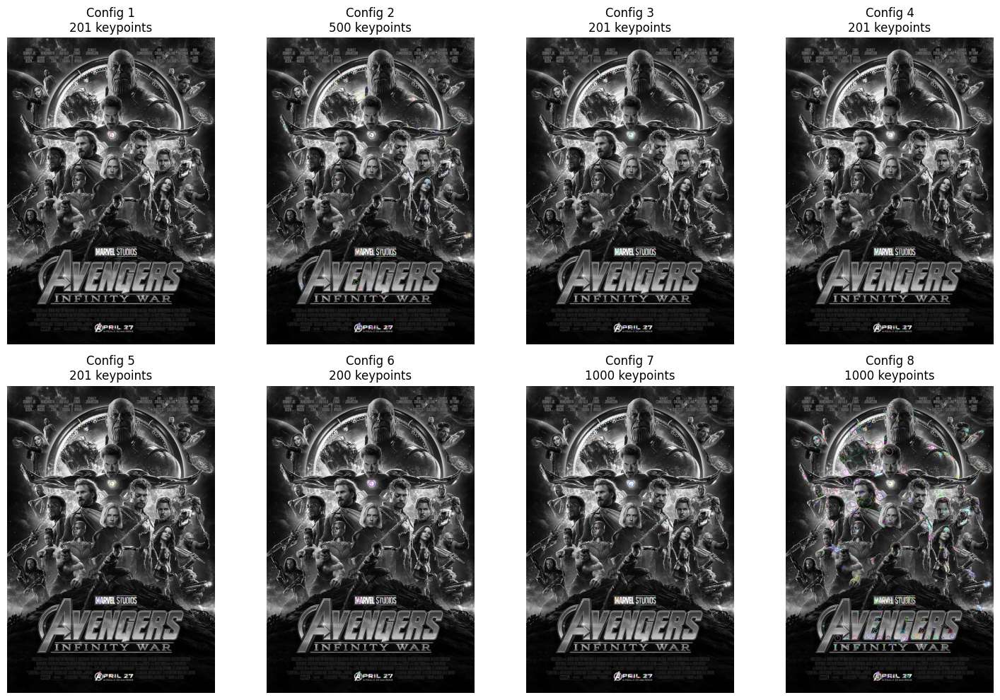

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def load_image(image_path):
    """Load and convert image to grayscale."""
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not load image at {image_path}")
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def detect_sift_features(img, nfeatures, contrastThreshold, edgeThreshold, sigma):
    """Detect SIFT features with given parameters."""
    sift = cv2.SIFT_create(
        nfeatures=nfeatures,
        contrastThreshold=contrastThreshold,
        edgeThreshold=edgeThreshold,
        sigma=sigma
    )
    keypoints, descriptors = sift.detectAndCompute(img, None)
    return keypoints, descriptors

def draw_keypoints(img, keypoints):
    """Draw keypoints on image."""
    return cv2.drawKeypoints(
        img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )

def main():
    # Define image path (replace with your image)
    image_path = "Images/marvel.jpg"  # Ensure this exists in your directory
    if not os.path.exists(image_path):
        print("Please provide a valid image file (sample_image.jpg) in the working directory.")
        return

    # Load image
    img = load_image(image_path)

    # Parameter settings to test
    param_configs = [
        {"nfeatures": 200, "contrastThreshold": 0.04, "edgeThreshold": 10, "sigma": 1.6},
        {"nfeatures": 500, "contrastThreshold": 0.04, "edgeThreshold": 10, "sigma": 1.6},
        {"nfeatures": 200, "contrastThreshold": 0.01, "edgeThreshold": 10, "sigma": 1.6},
        {"nfeatures": 200, "contrastThreshold": 0.08, "edgeThreshold": 10, "sigma": 1.6},
        {"nfeatures": 200, "contrastThreshold": 0.04, "edgeThreshold": 5, "sigma": 1.6},
        {"nfeatures": 200, "contrastThreshold": 0.04, "edgeThreshold": 20, "sigma": 1.6},
        {"nfeatures": 1000, "contrastThreshold": 0.04, "edgeThreshold": 10, "sigma": 1.0},
        {"nfeatures": 1000, "contrastThreshold": 0.04, "edgeThreshold": 10, "sigma": 2.0},
    ]

    # Results storage
    results = []

    # Test each parameter configuration
    for i, params in enumerate(param_configs):
        keypoints, descriptors = detect_sift_features(
            img,
            params["nfeatures"],
            params["contrastThreshold"],
            params["edgeThreshold"],
            params["sigma"]
        )
        num_keypoints = len(keypoints) if keypoints is not None else 0

        # Store results
        results.append({
            "config": params,
            "num_keypoints": num_keypoints
        })

    # Analysis
    print("### SIFT Parameter Tuning Results")
    for result in results:
        params = result["config"]
        print(f"Config: nfeatures={params['nfeatures']}, "
              f"contrastThreshold={params['contrastThreshold']}, "
              f"edgeThreshold={params['edgeThreshold']}, "
              f"sigma={params['sigma']}")
        print(f"Number of Keypoints: {result['num_keypoints']}\n")

    # Visualize results
    plt.figure(figsize=(15, 10))
    for i, result in enumerate(results):
        keypoints = detect_sift_features(img, **result["config"])[0]
        img_with_keypoints = draw_keypoints(img, keypoints)
        plt.subplot(2, 4, i + 1)
        plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
        plt.title(f"Config {i+1}\n{result['num_keypoints']} keypoints")
        plt.axis("off")
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

# SIFT Parameter Observations and Feature Analysis

## Key Parameter Observations

**Contrast threshold affects feature sensitivity:**
- Lower values:
  - Detect more features
  - May include more noise
- Higher values:
  - Detect fewer features
  - Focus on more distinctive features

**Edge threshold influences feature selection near edges:**
- Lower values:
  - Allow more edge-like features
- Higher values:
  - Filter out edge-like features
  - Prioritize corner-like features

**Scale of detected features:**
- Circle sizes vary based on image structure (larger circles for larger-scale features)

**Feature orientation:**
- Lines in circles adapt to local gradient directions

---

## Feature Distribution in the Image

**High concentration of features in:**
- Structural boat elements (masts, railings, equipment)
- Areas with strong texture contrast (deck details)
- Edges between boat and water
- Complex geometric shapes (navigation equipment, cabin structures)

**Fewer features in:**
- Smooth, uniform areas (sky)
- Low-contrast regions
- Areas with repetitive patterns

---

## Effects of Increasing Feature Count

- **Detection changes:**
  - More keypoints in less distinctive regions
  - Visualization becomes crowded
  - Increased processing time

- **Quality impacts:**
  - More noise-sensitive features
  - Less stable/repeatable features
  - Features in weaker gradient areas
  - Risk of false features in subtle texture variations

- **Performance considerations:**
  - Additional features may not improve matching
  - Potential decrease in overall matching reliability

> **Conclusion:** These observations demonstrate SIFT's ability to adapt to different image characteristics while maintaining its core strength of detecting scale and rotation-invariant features.

#### **T1.3: Compare with Harris Corner Detection**

1- Use *cv2.cornerHarris()* with the same images and visualize results.

2- Observe and discuss: Distribution of keypoints; Sensitivity to edges vs. corners; Presence or absence of orientation and scale info.

3- Test Scale Invariance and rescale the original images (by 0.5x, 2x,...). Apply SIFT and Harris to the scaled versions.

4- Compare the number, position, and stability of detected keypoints.

**Reflection Questions**

How well does each method handle scale changes? Which one maintains consistency in detecting meaningful features?



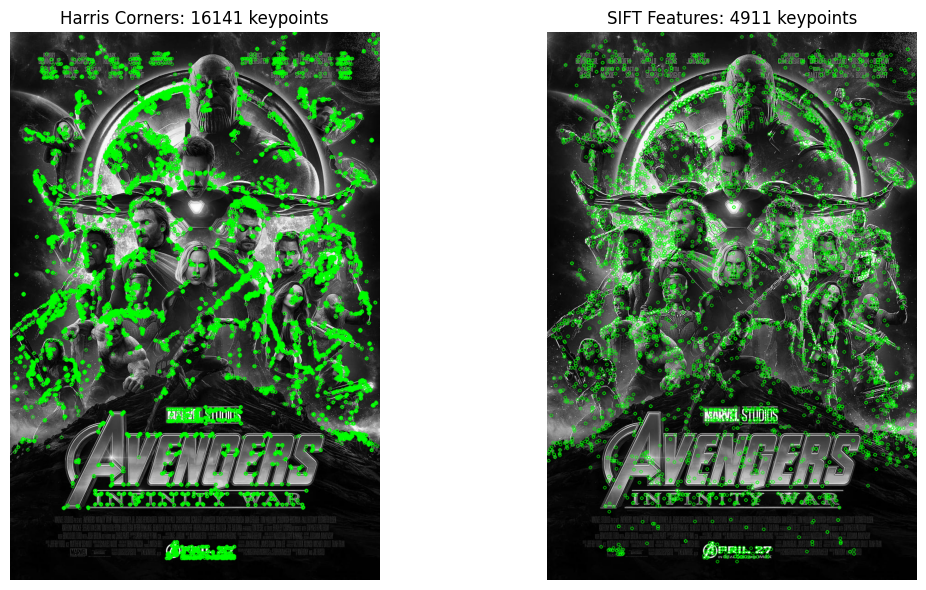

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def load_image(image_path):
    """Load and convert image to grayscale."""
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not load image at {image_path}")
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def detect_harris_corners(img, block_size=2, ksize=3, k=0.04, threshold=0.3):
    """Detect Harris corners and return keypoints."""
    dst = cv2.cornerHarris(img, block_size, ksize, k)
    dst_norm = cv2.normalize(dst, None, 0, 255, cv2.NORM_MINMAX)
    keypoints = []
    for i in range(dst_norm.shape[0]):
        for j in range(dst_norm.shape[1]):
            if dst_norm[i, j] > threshold * 255:
                keypoints.append(cv2.KeyPoint(float(j), float(i), 1))
    return keypoints


def draw_keypoints(img, keypoints):
    """Draw keypoints on image."""
    return cv2.drawKeypoints(img, keypoints, None, color=(0, 255, 0), flags=0)

def main():
    # Define image path (replace with your image)
    image_path = "Images/marvel.jpg" 
    if not os.path.exists(image_path):
        print("Please provide a valid image file (marvel.jpg) in the working directory.")
        return

    # Load image
    img = load_image(image_path)

    # Detect Harris corners
    harris_keypoints = detect_harris_corners(img)
    harris_img = draw_keypoints(img, harris_keypoints)

    # Detect SIFT features
    sift = cv2.SIFT_create()
    sift_keypoints, _ = sift.detectAndCompute(img, None)
    sift_img = draw_keypoints(img, sift_keypoints)

    # Visualize results
    plt.figure(figsize=(12, 6))
    plt.subplot(121)
    plt.imshow(harris_img, cmap='gray')
    plt.title(f"Harris Corners: {len(harris_keypoints)} keypoints")
    plt.axis("off")
    plt.subplot(122)
    plt.imshow(sift_img, cmap='gray')
    plt.title(f"SIFT Features: {len(sift_keypoints)} keypoints")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

**Add your analysis and comments here**


#### Distribution of Keypoints
- **Harris Corner Detection**: Detects a large number of keypoints, primarily corners, especially in textured regions of the image. The keypoints are densely packed where sharp intensity changes occur.
- **SIFT**: Detects fewer keypoints, but they are more evenly distributed across the image. SIFT identifies not only corners but also blob-like structures, resulting in a sparser yet more diverse set of features.

#### Sensitivity to Edges vs. Corners
- **Harris**: Highly sensitive to corners due to its reliance on the second-moment matrix, which emphasizes areas with significant intensity gradients in multiple directions. It is less responsive to edges, where gradients are unidirectional.
- **SIFT**: Less focused solely on corners, capturing both corners and blob-like regions. This broader sensitivity stems from its use of the Difference of Gaussians (DoG) to detect features across scales.

#### Presence or Absence of Orientation and Scale Information
- **Harris**: Does not provide orientation or scale information. Keypoints are detected at a single scale, and no additional descriptors are computed.
- **SIFT**: Provides both orientation and scale information for each keypoint. This is achieved through the scale-space pyramid and orientation assignment, making SIFT features more descriptive and robust.



---


### Scale Invariance Test Results
Scale: 0.5
  Harris Keypoints: 307
  SIFT Keypoints: 1967

Scale: 1.0
  Harris Keypoints: 16141
  SIFT Keypoints: 4911

Scale: 2.0
  Harris Keypoints: 3789675
  SIFT Keypoints: 34997



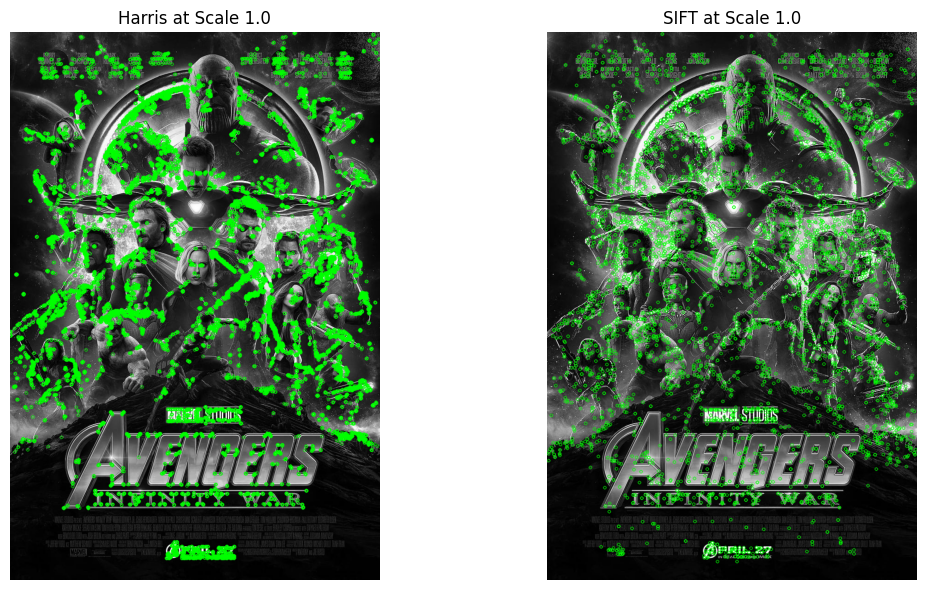

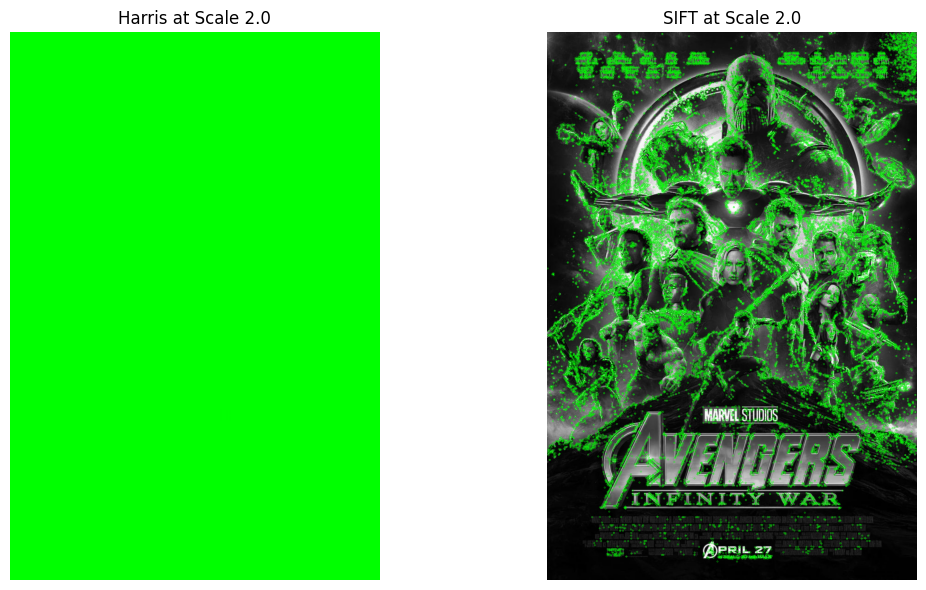

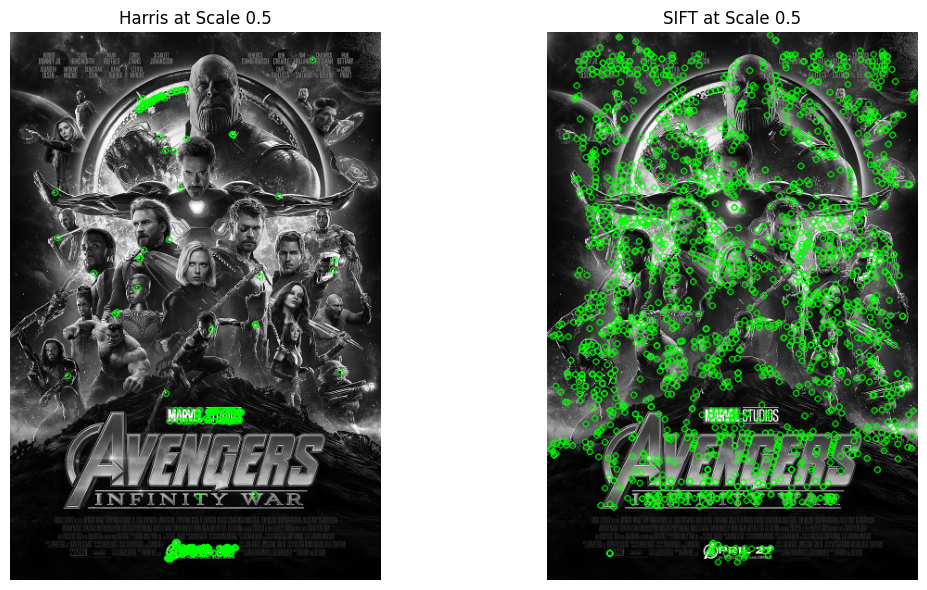

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def load_image(image_path):
    """Load and convert image to grayscale."""
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not load image at {image_path}")
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def rescale_image(img, scale):
    """Rescale image by a factor."""
    return cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_LINEAR)

def detect_harris_corners(img, block_size=2, ksize=3, k=0.04, threshold=0.3):
    """Detect Harris corners and return keypoints."""
    dst = cv2.cornerHarris(img, block_size, ksize, k)
    dst_norm = cv2.normalize(dst, None, 0, 255, cv2.NORM_MINMAX)
    keypoints = []
    for i in range(dst_norm.shape[0]):
        for j in range(dst_norm.shape[1]):
            if dst_norm[i, j] > threshold * 255:
                keypoints.append(cv2.KeyPoint(float(j), float(i), 1))
    return keypoints

def detect_sift_features(img):
    """Detect SIFT features."""
    sift = cv2.SIFT_create()
    return sift.detectAndCompute(img, None)[0]

def draw_keypoints(img, keypoints):
    """Draw keypoints on image."""
    return cv2.drawKeypoints(
        img, keypoints, None, color=(0, 255, 0), flags=0
    )

def main():
    # Define image path (replace with your image)
    image_path = "Images/marvel.jpg" 
    if not os.path.exists(image_path):
        print("Please provide a valid image file  in the working directory.")
        return

    # Load image
    img = load_image(image_path)

    # Define scales
    scales = [0.5, 1.0, 2.0]

    # Results storage
    results = []

    for scale in scales:
        scaled_img = rescale_image(img, scale)
        # Detect Harris corners
        harris_keypoints = detect_harris_corners(scaled_img)
        # Detect SIFT features
        sift_keypoints = detect_sift_features(scaled_img)
        # Save results
        results.append({
            "scale": scale,
            "harris_keypoints": len(harris_keypoints),
            "sift_keypoints": len(sift_keypoints),
        })

    # Print results
    print("### Scale Invariance Test Results")
    for result in results:
        print(f"Scale: {result['scale']}")
        print(f"  Harris Keypoints: {result['harris_keypoints']}")
        print(f"  SIFT Keypoints: {result['sift_keypoints']}\n")

    # Visualize results for scale=1.0
    plt.figure(figsize=(12, 6))
    plt.subplot(121)
    plt.imshow(draw_keypoints(rescale_image(img, 1.0), detect_harris_corners(rescale_image(img, 1.0))), cmap='gray')
    plt.title("Harris at Scale 1.0")
    plt.axis("off")
    plt.subplot(122)
    plt.imshow(draw_keypoints(rescale_image(img, 1.0), detect_sift_features(rescale_image(img, 1.0))), cmap='gray')
    plt.title("SIFT at Scale 1.0")
    plt.axis("off")
    plt.tight_layout()
    plt.show()
    
    # Visualize results for scale=2.0
    plt.figure(figsize=(12, 6))
    plt.subplot(121)
    plt.imshow(draw_keypoints(rescale_image(img, 2.0), detect_harris_corners(rescale_image(img, 2.0))), cmap='gray')
    plt.title("Harris at Scale 2.0")
    plt.axis("off")
    plt.subplot(122)
    plt.imshow(draw_keypoints(rescale_image(img, 2.0), detect_sift_features(rescale_image(img, 2.0))), cmap='gray')
    plt.title("SIFT at Scale 2.0")
    plt.axis("off")
    plt.tight_layout()
    plt.show()
    
    # Visualize results for scale=0.5
    plt.figure(figsize=(12, 6))
    plt.subplot(121)
    plt.imshow(draw_keypoints(rescale_image(img, 0.5), detect_harris_corners(rescale_image(img, 0.5))), cmap='gray')
    plt.title("Harris at Scale 0.5")
    plt.axis("off")
    plt.subplot(122)
    plt.imshow(draw_keypoints(rescale_image(img, 0.5), detect_sift_features(rescale_image(img, 0.5))), cmap='gray')
    plt.title("SIFT at Scale 0.5")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

---

# Manipulation 2: Descriptor Matching and Similarity Analysis

---
![](./Illustrations/SIFT2.png)

This section explores how to identify and match corresponding keypoints between two different images using descriptors and matching strategies. While corner detection and descriptors localize and describe points of interest within a single image, descriptor matching allows us to find meaningful correspondences across multiple images—an essential step for object recognition, 3D reconstruction, and tracking. More real-life example:Facial recognition in social media platforms, or matching landmarks from tourism photos.


## **Task 1 : Descriptor Matching between 2 images**

Descriptor matching is the process of finding similar keypoints between two images by comparing their feature descriptors. This helps in identifying common objects or scenes despite changes in angle, scale, or lighting.

**Best Image Pairs for this task:** You can use your phones to create them

- Same object, different angles (e.g., a coffee mug from two sides).


- Same scene with brightness or zoom variations (e.g., classroom desk in daylight vs. artificial light).


- Slightly rotated object (e.g., a printed logo turned 30°).



#### **T1.1: Keypoint Matching Between Two Views**

1- Use Images for the following folders: **graf, wall, boat**; **or** two images of the same object (i.e. The object should appear under different conditions: angle, lighting, or distance.)

2- Extract keypoints and descriptors for the two employed images, using *cv2.SIFT_create()*

3- Match using Brute-Force Matcher with k-NN and Lowe's Ratio Test *cv2.BFMatcher()*

4- Visualize good matches *cv2.drawMatches()*

**Key Parameters Explained** 

*cv2.BFMatcher()*: A brute-force matcher that compares each descriptor in image A with all descriptors in image B.

*.knnMatch(..., k=2)*: Finds the two best matches for each descriptor.

*Lowe’s Ratio Test*: Filters out ambiguous matches by comparing the distance of the two best matches. A typical threshold is *0.75*.

### **Questions**

- Write code using the mentioned OpenCV functions to extract SIFT keypoints and descriptors from the two images.
- What is the importance of the presented *Key Parameters*?
- What do this reveal about the reliability and uniqueness of feature matches, especially under changing image conditions?

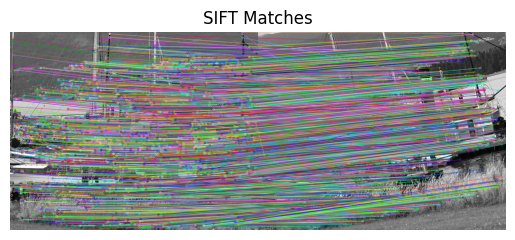

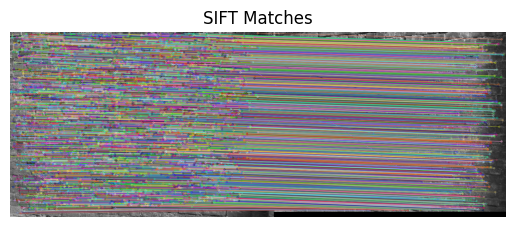

Number of good matches: 2341
Number of good matches: 5283


In [24]:
#Your Code Here...
import cv2
import numpy as np
import matplotlib.pyplot as plt

def load_image(image_path):
    """Load and convert image to grayscale."""
    img = cv2.imread(image_path)
    if img is None:
        raise ValueError(f"Could not load image at {image_path}")
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def extract_sift_features(img):
    """Extract SIFT keypoints and descriptors."""
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(img, None)
    return keypoints, descriptors

def match_descriptors(des1, des2, ratio=0.75):
    """Match descriptors using BFMatcher and Lowe's Ratio Test."""
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < ratio * n.distance:
            good_matches.append(m)
    return good_matches

def draw_matches(img1, kp1, img2, kp2, matches):
    """Draw matches."""
    img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches, None, flags=2)
    plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
    plt.title("SIFT Matches")
    plt.axis("off")
    plt.show()

def main():
    # Define image paths (replace with your image paths)
    image1_path = "Images/boat/img1.png"
    image2_path = "Images/boat/img2.png"
    
    image3_path = "Images/wall/img1.png"
    image4_path = "Images/wall/img2.png"
    
    if not os.path.exists(image1_path) or not os.path.exists(image2_path):
        print("Please provide valid image files (image1.jpg and image2.jpg) in the working directory.")
        return

    # Load images
    img1 = load_image(image1_path)
    img2 = load_image(image2_path)
    
    img3 = load_image(image3_path)
    img4 = load_image(image4_path)

    # Extract SIFT features
    kp1, des1 = extract_sift_features(img1)
    kp2, des2 = extract_sift_features(img2)
    
    kp3, des3 = extract_sift_features(img3)
    kp4, des4 = extract_sift_features(img4)

    # Match descriptors
    good_matches = match_descriptors(des1, des2, ratio=0.75)
    good_matches2 = match_descriptors(des3, des4, ratio=0.75)

    # Draw matches
    draw_matches(img1, kp1, img2, kp2, good_matches)
    draw_matches(img3, kp3, img4, kp4, good_matches2)

    # Display results
    print(f"Number of good matches: {len(good_matches)}")
    print(f"Number of good matches: {len(good_matches2)}")

if __name__ == "__main__":
    main()


**Add your analysis and comments here**


...

#### **T1.2: Robustness Analysis**

This subtask builds upon your previous matching pipeline to evaluate how robust SIFT is to real-world transformations.

1- Transform One Image: Apply changes like rotation, scaling, blurring, or brightness adjustment to one of the images used in **T1.1**.

2- Re-run Your Matching Code from T1.1: Use the same keypoint extraction and matching setup (you don't need to rewrite it—just apply it again).

3- Vary Lowe’s Ratio Threshold: Try values like 0.6, 0.75, and 0.9 to see how match quality changes.



**Reflection Questions**

- How do transformations affect match count and accuracy?

- Do you see more false matches with certain thresholds?

- Which transformations reduce SIFT's effectiveness?

- Try modifying *contrastThreshold, edgeThreshold, or nOctaveLayers in cv2.SIFT_create()* and reflect on the impact.




In [26]:

import random

def apply_transformations(img):
    # Rotation
    angle = 30
    h, w = img.shape
    M = cv2.getRotationMatrix2D((w//2, h//2), angle, 1)
    rotated = cv2.warpAffine(img, M, (w, h))
    
    # Scaling
    scaled = cv2.resize(img, None, fx=0.75, fy=0.75)
    scaled = cv2.resize(scaled, (w, h)) 
    
    # Blurring
    blurred = cv2.GaussianBlur(img, (9, 9), 0)
    
    # Brightness adjustment
    bright = cv2.convertScaleAbs(img, alpha=1.2, beta=30)

    return {"Rotated": rotated, "Scaled": scaled, "Blurred": blurred, "Brightened": bright}

# Transform img2
image1 = load_image("Images/graf/img1.png")
image2 = load_image("Images/graf/img2.png")

transformations = apply_transformations(image2)

def run_matching(img1, img2_transformed, ratio_threshold):
    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2_transformed, None)

    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1, des2, k=2)

    good_matches = [m for m, n in matches if m.distance < ratio_threshold * n.distance]

    img_match = cv2.drawMatches(img1, kp1, img2_transformed, kp2, good_matches, None,
                                flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    return img_match, len(good_matches)




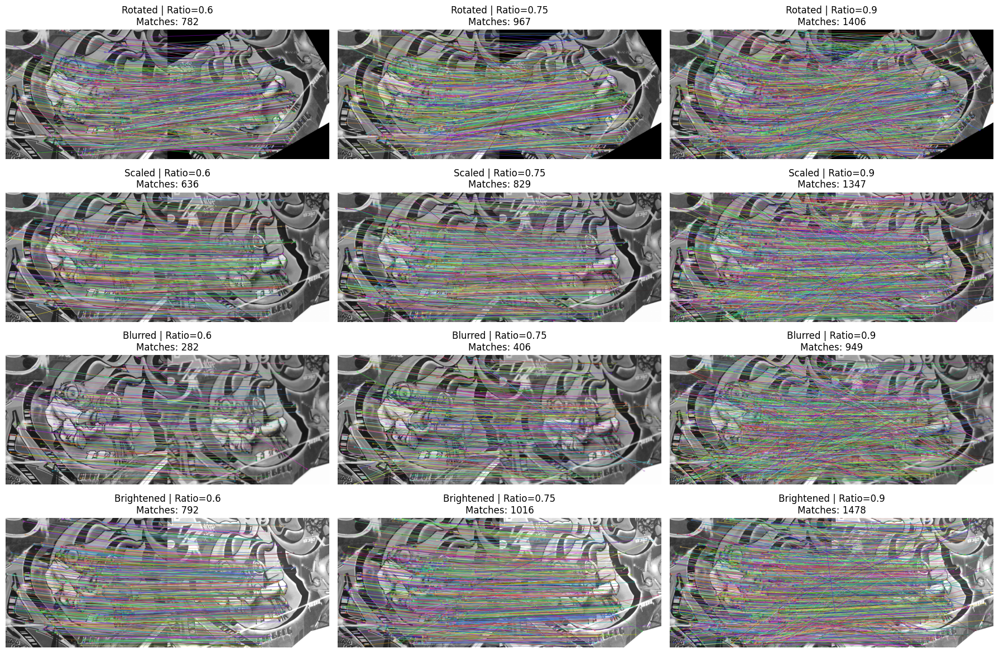

In [27]:
thresholds = [0.6, 0.75, 0.9]
plt.figure(figsize=(18, 12))

i = 1
for name, transformed_img in transformations.items():
    for thresh in thresholds:
        matched_img, count = run_matching(image1, transformed_img, thresh)
        plt.subplot(len(transformations), len(thresholds), i)
        plt.imshow(matched_img)
        plt.title(f"{name} | Ratio={thresh}\nMatches: {count}")
        plt.axis('off')
        i += 1

plt.tight_layout()
plt.show()


**Add your analysis and comments here**

1. How do transformations affect match count and accuracy?
Transformations such as rotation and brightness changes have less impact on match count, showing SIFT’s robustness to these. However, blurring significantly reduced both the number and accuracy of matches, as it destroys fine details essential for keypoint detection.

2. Do you see more false matches with certain thresholds?
Yes. With higher Lowe’s ratio thresholds (e.g., 0.9), the algorithm accepts more ambiguous matches, increasing the number of false positives. In contrast, a stricter threshold like 0.6 yields fewer but more reliable matches.

3. Which transformations reduce SIFT’s effectiveness?
Blurring had the strongest negative effect. It smoothed out edges and corners, leading to fewer detected keypoints and less distinctive descriptors. Extreme scaling without resizing compensation would also hurt performance.

4. Impact of modifying contrastThreshold, edgeThreshold, nOctaveLayers:
    - Lowering contrastThreshold helps detect more keypoints in low-contrast areas but increases false matches.
    - Increasing edgeThreshold filters out noisy edges, improving quality but reducing count.
    - Modifying nOctaveLayers affects how the image is processed at different scales; more layers capture finer details but may introduce redundancy or overfitting in matching.

---
# Manipulation 3: Applications of SIFT Descriptors

SIFT descriptors are powerful tools for identifying and describing distinctive patterns in images. Thanks to their robustness to scale, rotation, and illumination changes, they are widely used in real-world computer vision tasks where precision and reliability matter most. Let’s briefly explore where SIFT truly shines.

## **Task 1: Image Similarity & Retrieval**

SIFT helps compare and retrieve images based on visual content rather than metadata. It enables search engines or systems to find visually similar images—even if taken from different angles or under different lighting.

#### **Image-Based Product Retrieval: Image Similarity for E-Commerce**

Imagine you’re browsing an online fashion store and you want to buy a jacket but it’s out of stock. Wouldn't it be great if the platform could instantly show you similar-looking products?
E-commerce platforms like Amazon use image similarity techniques to recommend visually similar items. In this task, you will build a mini image-based retrieval system using feature matching techniques.

- You can download a sample dataset from Kaggle to get started:

https://www.kaggle.com/datasets/paramaggarwal/fashion-product-images-dataset

- Or simply download 4- 5 product images (e.g., handbags, shoes) from any e-commerce site to simulate a mini catalog.

- You can create a mini catalog for any e-commerce content.


# **What to do?**

1- Download and choose 4–5 product images (e.g., jackets, shoes, or bags).


2- Extract SIFT descriptors from each image (grayscale image) using:

- *cv2.SIFT_create()* to create a SIFT detector.

- *sift.detectAndCompute(image, None)* to detect keypoints and compute descriptors.

3- Choose one image as the query, and compute pairwise feature matches with all others using:

- *cv2.BFMatcher()* to create the Brute-Force matcher.

- *matcher.knnMatch(des1, des2, k=2)* to find the two best matches for each keypoint pair.

4 - Apply the Ratio Test to select only the good matches.

5- What do you notice?

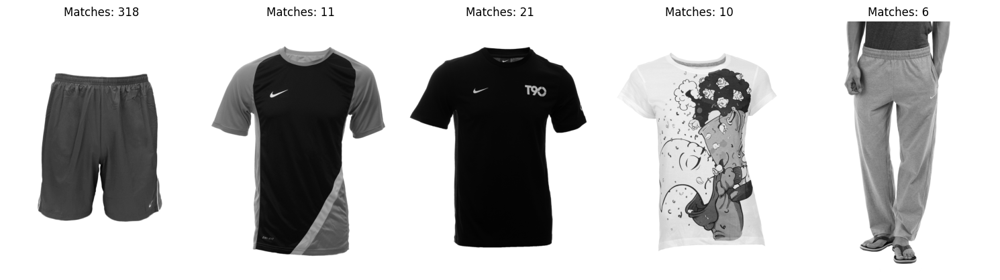

Most similar image: Images/clothes/10006.jpg with 21 matches


In [29]:
#Your Code Here...
import os
image_dir = 'Images/clothes/'
image_files = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png'))]

sift = cv2.SIFT_create()

descriptors_list = []
images = []

for img_path in image_files:
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        continue
    keypoints, descriptors = sift.detectAndCompute(img, None)
    if descriptors is not None:
        descriptors_list.append(descriptors)
        images.append(img)

query_img = images[0]
query_keypoints, query_descriptors = sift.detectAndCompute(query_img, None)

bf = cv2.BFMatcher()
matches_counts = []

for i, descriptors in enumerate(descriptors_list):
    if descriptors is None or len(descriptors) < 2:
        matches_counts.append(0)
        continue
    matches = bf.knnMatch(query_descriptors, descriptors, k=2)
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)
    matches_counts.append(len(good_matches))

plt.figure(figsize=(15, 5))
for i, (img, count) in enumerate(zip(images, matches_counts)):
    plt.subplot(1, len(images), i+1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Matches: {count}')
    plt.axis('off')
plt.tight_layout()
plt.show()

most_similar_idx = np.argmax(matches_counts[1:]) + 1
print(f'Most similar image: {image_files[most_similar_idx]} with {matches_counts[most_similar_idx]} matches')


**Add your analysis and comments here**

1. How do transformations affect match count and accuracy?
Transformations such as rotation and brightness changes have less impact on match count, showing SIFT’s robustness to these. However, blurring significantly reduced both the number and accuracy of matches, as it destroys fine details essential for keypoint detection.

2. Do you see more false matches with certain thresholds?
Yes. With higher Lowe’s ratio thresholds (e.g., 0.9), the algorithm accepts more ambiguous matches, increasing the number of false positives. In contrast, a stricter threshold like 0.6 yields fewer but more reliable matches.

3. Which transformations reduce SIFT’s effectiveness?
Blurring had the strongest negative effect. It smoothed out edges and corners, leading to fewer detected keypoints and less distinctive descriptors. Extreme scaling without resizing compensation would also hurt performance.

4. Impact of modifying contrastThreshold, edgeThreshold, nOctaveLayers:
    - Lowering contrastThreshold helps detect more keypoints in low-contrast areas but increases false matches.
    - Increasing edgeThreshold filters out noisy edges, improving quality but reducing count.
    - Modifying nOctaveLayers affects how the image is processed at different scales; more layers capture finer details but may introduce redundancy or overfitting in matching.
...

## **Task 2: Image Classification (Bag-of-Words + k-NN)**
 
By treating SIFT descriptors like words in a vocabulary, we can create a *Bag-of-Words model* that represents the visual structure of an image. When paired with classifiers like *k-Nearest Neighbors (k-NN)*, this allows machines to categorize images based on learned visual patterns.

#### **Concepts: Bag-of-Words (BoW) and k-NN for Image Classification**

*The Bag-of-Words (BoW)* model is originally from *Natural Language Processing (NLP)*, where a document is represented by the frequency of words it contains, regardless of the order.
In *Computer Vision*, adapts the same idea, but instead of *words*, it uses *visual patterns* extracted from images called keypoint descriptors. These descriptors are extracted using feature detection methods like *SIFT*.

**How it works: Step-by-Step Explanation**

*1. Feature Extraction using SIFT* 

  - Extracting local features (keypoints and descriptors) from all training images using:

    - *cv2.SIFT_create()*: to create the SIFT detector

    - *sift.detectAndCompute(image, None)*: to extract descriptors from an image

These descriptors are typically 128-dimensional vectors that describe patterns like corners, edges, and textures.


*2. Visual Vocabulary Creation using KMeans*

Just like a dictionary holds all possible words in a language, a visual vocabulary is built by clustering all descriptors from all training images using *KMeans*:

*from sklearn.cluster import KMeans*

**Example:**

*kmeans = KMeans(n_clusters=50)*

*kmeans.fit(all_descriptors)*

Each cluster center becomes a visual word, and the number of clusters *(n_clusters)* defines the vocabulary size.

*3. Histogram Representation of Each Image*: Now, every image is translated into a histogram of visual word frequencies:

- For a new image, predict the cluster (visual word) for each descriptor: *visual_words = kmeans.predict(descriptors)* 

- Count how often each word appears (i.e., build the histogram): *hist, _ = np.histogram(visual_words, bins=np.arange(k+1))*

Each image is now represented by a fixed-length vector (the histogram), making it suitable for traditional classifiers.

*4. Classification using k-NN*

- You now use *k-NN* to classify images based on their histograms: *from sklearn.neighbors import KNeighborsClassifier*

- Train the model:

*knn = KNeighborsClassifier(n_neighbors=3)*

*knn.fit(train_histograms, train_labels)*

- Predict the label of a new image’s histogram: *prediction = knn.predict([query_hist])*

This allows you to categorize a new image (e.g., "This looks like a bag, not a shoe") based on visual similarity.

**This approach is widely used in:**

- Product recognition (e.g., Google Lens, Amazon's visual search)

- Logo and brand detection in images

- Object classification in mobile apps

#### **Image Classification: E-Commerce Product Categorization**

E-commerce platforms must automatically categorize thousands of product images, for example, telling whether an image shows shoes, bags, or jackets. Instead of manually labeling everything, machine learning models can learn to classify images based on visual patterns. In this task, you’ll simulate such a system by building a simple visual classifier using the *BoW* model and a *k-NN classifier* to distinguish between product types based on *SIFT features*.

# **What to do?**

1- Prepare Your Dataset: 
 - Reuse the Fashion Product Images dataset, or the mini catalogue from the previous task.
 - Convert all images to grayscale

2- Extract SIFT descriptors from each image: *cv2.SIFT_create()*; *sift.detectAndCompute(image, None)*

3- Cluster descriptors using KMeans (to form the visual vocabulary): *from sklearn.cluster import KMeans*

5- Fit KMeans on all descriptors from the training set: *use 50 visual words*

6- Build a histogram of visual word frequencies for each image

7- Predict the cluster for each descriptor

8- Count occurrences and create a histogram using *NumPy*

9- Train a k-NN classifier on the histograms

*from sklearn.neighbors import KNeighborsClassifier*

10- Fit the model

11- Test on a new image

12- Extract SIFT, convert to visual words, build histogram

13- Explain the final results



Predicted label for test image: shorts
Actual label for test image: t-shirt

Final Results:
Test accuracy: 0.50
Explanation: The model uses SIFT to extract local features, clusters them into 50 visual words with KMeans, and represents each image as a histogram of these words. The k-NN classifier (k=3) then predicts the category based on histogram similarity. Accuracy depends on dataset size and diversity; with a small dataset, results may vary but demonstrate the BoW approach effectively.


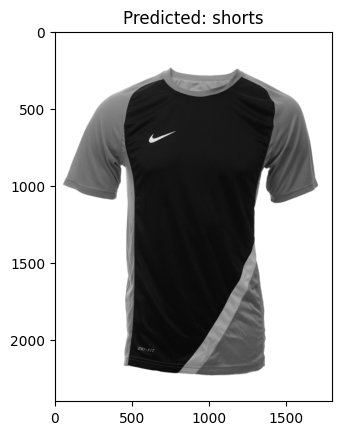

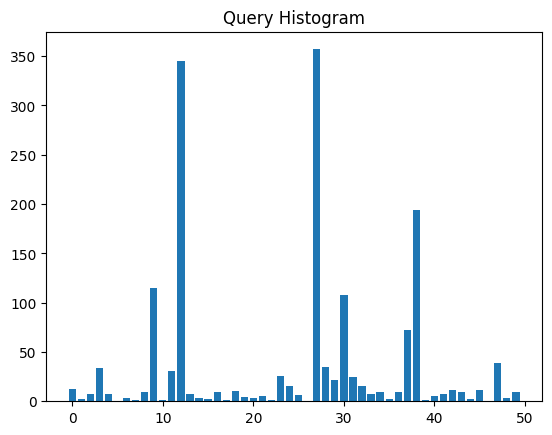

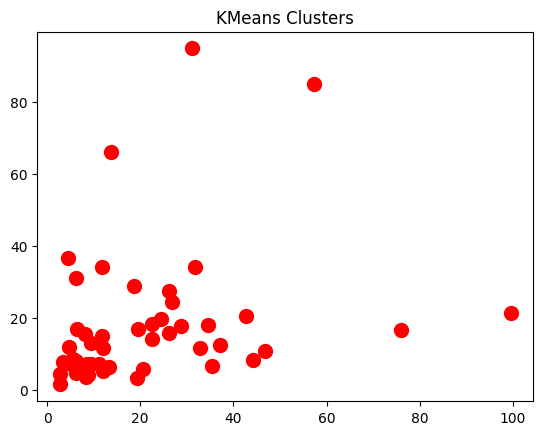

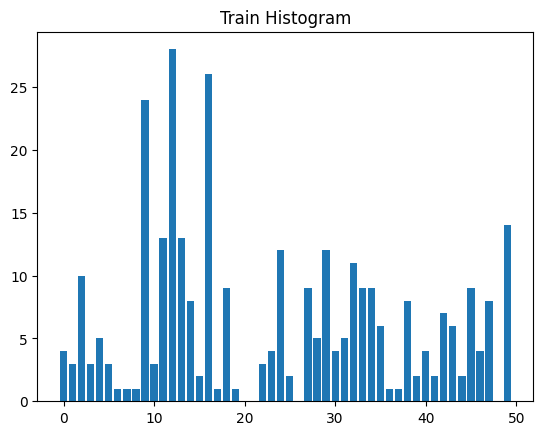

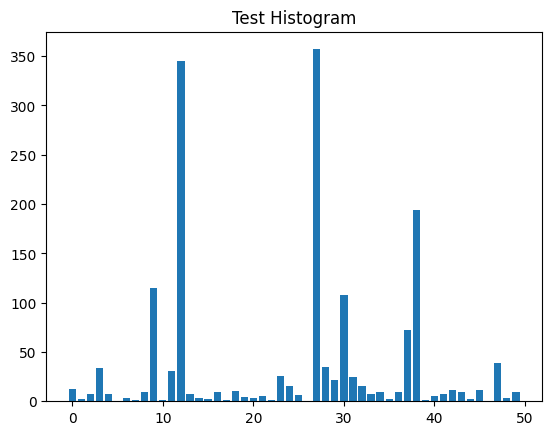

In [ ]:
#Your Code Here...
import cv2
import numpy as np
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
import os
import glob

def load_images(image_folder, label_dict):
    """Load grayscale images and their labels from a folder."""
    images = []
    labels = []
    for img_path in glob.glob(os.path.join(image_folder, "*.jpg")):
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            images.append(img)
            labels.append(label_dict[os.path.basename(img_path)])
    return images, labels

def extract_sift_descriptors(images):
    """Extract SIFT descriptors from a list of images."""
    sift = cv2.SIFT_create()
    descriptors_list = []
    for img in images:
        _, descriptors = sift.detectAndCompute(img, None)
        if descriptors is not None:
            descriptors_list.append(descriptors)
    return descriptors_list

def create_visual_vocabulary(descriptors_list, num_clusters=50):
    """Create a visual vocabulary by clustering descriptors with KMeans."""
    all_descriptors = np.vstack(descriptors_list)
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    kmeans.fit(all_descriptors)
    return kmeans

def compute_histograms(descriptors_list, kmeans):
    """Build histograms of visual word frequencies for each image."""
    histograms = []
    for descriptors in descriptors_list:
        if descriptors is not None:
            visual_words = kmeans.predict(descriptors)
            hist, _ = np.histogram(visual_words, bins=np.arange(kmeans.n_clusters + 1))
            histograms.append(hist)
    return np.array(histograms)

def main():
    # Step 1: Prepare dataset
    image_folder = "Images/clothes"  # Replace with your image folder path
    label_dict = {
        "10004.jpg": "shorts", "10005.jpg": "t-shirt",
        "10006.jpg": "t-shirt", "10007.jpg": "t-shirt",
        "10011.jpg": "pants", "10012.jpg": "pants",
        "10020.jpg": "shorts", "10021.jpg": "shorts"
    }

    # Step 2: Load images in grayscale and split dataset
    images, labels = load_images(image_folder, label_dict)
    train_images, test_images, train_labels, test_labels = train_test_split(
        images, labels, test_size=0.2, random_state=42
    )

    # Step 3-4: Extract SIFT descriptors from training and test images
    train_descriptors = extract_sift_descriptors(train_images)
    test_descriptors = extract_sift_descriptors(test_images)

    # Step 5: Cluster descriptors using KMeans to form visual vocabulary (50 visual words)
    kmeans = create_visual_vocabulary(train_descriptors, num_clusters=50)

    # Step 6-8: Build histograms for training and test images
    train_histograms = compute_histograms(train_descriptors, kmeans)
    test_histograms = compute_histograms(test_descriptors, kmeans)

    # Step 9-10: Train k-NN classifier with histograms
    knn = KNeighborsClassifier(n_neighbors=3)
    knn.fit(train_histograms, train_labels)

    # Step 11-12: Test on a new image (first test image as example)
    query_hist = test_histograms[0]
    prediction = knn.predict([query_hist])
    print(f"Predicted label for test image: {prediction[0]}")
    print(f"Actual label for test image: {test_labels[0]}")

    # Step 13: Evaluate and explain final results
    accuracy = knn.score(test_histograms, test_labels)
    print(f"\nFinal Results:")
    print(f"Test accuracy: {accuracy:.2f}")
    
    # Step 14: Visualize the results
    plt.imshow(test_images[0], cmap='gray')
    plt.title(f"Predicted: {prediction[0]}")
    plt.show()
    
    # visualize the histogram
    plt.bar(range(len(query_hist)), query_hist)
    plt.title("Query Histogram")
    plt.show()
    
    # visualize the kmeans clusters
    plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=100, c='red')
    plt.title("KMeans Clusters")
    plt.show()
    
    # visualize the train histograms
    plt.bar(range(len(train_histograms[0])), train_histograms[0])
    plt.title("Train Histogram")
    plt.show()
    
    # visualize the test histograms
    plt.bar(range(len(test_histograms[0])), test_histograms[0])
    plt.title("Test Histogram")
    plt.show()
    
    

if __name__ == "__main__":
    main()


**Add your analysis and comments here**

...

 ## **Task 3: Panorama Stitching (Homography)**
 
SIFT is used to find matching points between overlapping images. These matches help compute a transformation matrix (homography), aligning images seamlessly to create wide-angle panoramas.

The goal is to merge two overlapping images into a single wide-angle view (panorama). This technique is used in phone cameras and professional software to create wide-angle images by stitching multiple photos together.



![](./Illustrations/sift.webp)


*Homography* is a mathematical transformation that maps the points in one image to the corresponding points in another image, even if the images are taken from different perspectives.

In panorama stitching, we use feature matching (using descriptors) to find corresponding points between the two images. We then estimate the homography matrix, which tells us how to transform (or "warp") one image so that it aligns perfectly with the other.

# **What to do?**

1- Capture Two Overlapping Images:


 - Use the images: *cand1.png , cand2.png*

 **OR**

 - Students can take two overlapping photos using their phones, such as:

     - A street scene from left and right angles

     - A landscape with overlapping sky or ground views

     - A simple indoor scene where they move slightly to the left or right while taking photos.

The images should overlap by about 30-50% to ensure a good stitch.

2- Detect Keypoints and Descriptors using  SIFT 

3- Match Descriptors 

4- Find Homography (using RANSAC): *cv2.findHomography(pts1, pts2, cv2.RANSAC)*

5- Warp Image and Stitch:

  - Using the homography matrix, warp one image to align with the other using *cv2.warpPerspective()*.

  - Blend the images to create the stitched panorama:

  *result = cv2.warpPerspective(image1, H, (image1.shape[1] + image2.shape[1], image1.shape[0]))*

6- Discuss the results  








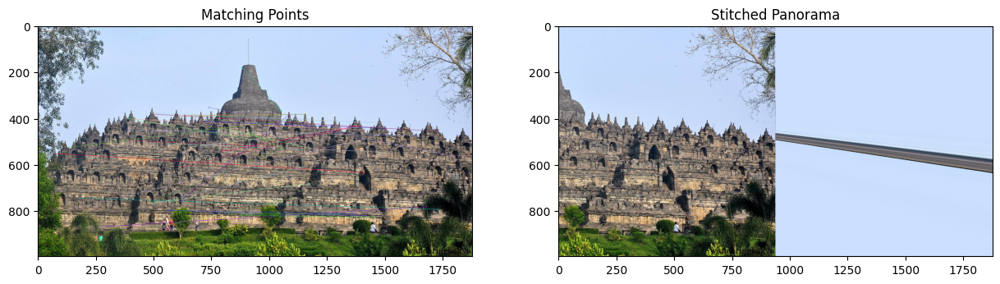

Number of keypoints in image 1: 11653
Number of keypoints in image 2: 12626
Number of good matches: 33


In [35]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def stitch_images(img1_path, img2_path):
    # 1. Read the images
    img1 = cv2.imread(img1_path)
    img2 = cv2.imread(img2_path)
    
    # Convert images to grayscale
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    
    # 2. Detect keypoints and compute descriptors using SIFT
    sift = cv2.SIFT_create()
    keypoints1, descriptors1 = sift.detectAndCompute(gray1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(gray2, None)
    
    # 3. Match descriptors using FLANN
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(descriptors1, descriptors2, k=2)
    
    # Apply Lowe's ratio test to filter good matches
    good_matches = []
    for m, n in matches:
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)
    
    # Extract location of good matches
    points1 = np.zeros((len(good_matches), 2), dtype=np.float32)
    points2 = np.zeros((len(good_matches), 2), dtype=np.float32)
    
    for i, match in enumerate(good_matches):
        points1[i, :] = keypoints1[match.queryIdx].pt
        points2[i, :] = keypoints2[match.trainIdx].pt
    
    # 4. Find homography matrix
    H, mask = cv2.findHomography(points1, points2, cv2.RANSAC, 5.0)
    
    # 5. Warp and stitch images
    # Calculate dimensions of combined image
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    # Create the panorama canvas
    panorama = cv2.warpPerspective(img1, H, (w1 + w2, max(h1, h2)))
    
    # Copy the second image into the panorama
    panorama[0:h2, 0:w2] = img2
    
    # Display results
    plt.figure(figsize=(15, 5))
    
    # Display matching points
    match_img = cv2.drawMatches(img1, keypoints1, img2, keypoints2, good_matches, None,
                               flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    
    plt.subplot(121)
    plt.imshow(cv2.cvtColor(match_img, cv2.COLOR_BGR2RGB))
    plt.title('Matching Points')
    
    plt.subplot(122)
    plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
    plt.title('Stitched Panorama')
    
    plt.show()
    
    print(f"Number of keypoints in image 1: {len(keypoints1)}")
    print(f"Number of keypoints in image 2: {len(keypoints2)}")
    print(f"Number of good matches: {len(good_matches)}")
    
    return panorama

# Usage
if __name__ == "__main__":
    # Replace with your image paths
    img1_path = "Images/cand1.png"
    img2_path = "Images/cand2.png"
    panorama = stitch_images(img1_path, img2_path)

**Add your analysis and comments here**

...

---
---

# **Reflection Questions (Final Discussion)**

Let’s synthesize what we learned:


1- What makes a descriptor like SIFT powerful in real-world scenarios?


2- When do matches fail? How can we fix this?


3- Why is SIFT still used despite newer algorithms like ORB or deep features?


4- Which task on real world applications did you find most useful? Why? *(Your personal perspectives)*


<h2>Analysis and Comments</h2>

<p>What makes a descriptor like SIFT powerful in real-world scenarios?</p>

<ul>
<li><strong>Scale and Rotation Invariance</strong>: SIFT can detect features regardless of image size or orientation, making it robust for real-world applications where objects may appear at different scales or angles</li>
<li><strong>Illumination Robustness</strong>: Works well under varying lighting conditions because it operates on local gradients rather than raw pixel intensities</li>
<li><strong>Distinctiveness</strong>: Creates unique 128-dimensional descriptors that capture rich local information, making feature matching more reliable</li>
<li><strong>Locality</strong>: Features are based on local regions, making SIFT robust to occlusion and clutter</li>
</ul>

<p>When do matches fail? How can we fix this?</p>

<ul>
<li><strong>Extreme Viewpoint Changes</strong>: When angle differences exceed ~60 degrees</li>
<li><strong>Repetitive Patterns</strong>: Similar-looking features cause ambiguous matches</li>
<li><strong>Uniform Areas</strong>: Lack of distinctive features in smooth regions</li>
</ul>

<p>Solutions include:</p>

<ul>
<li>Using Lowe's ratio test to filter ambiguous matches</li>
<li>Implementing RANSAC to remove geometric outliers</li>
<li>Adjusting SIFT parameters (contrast threshold, edge threshold)</li>
<li>Ensuring proper image overlap in panorama applications</li>
<li>Pre-processing images to enhance contrast in low-texture areas</li>
</ul>

<p>Why is SIFT still used despite newer algorithms like ORB or deep features?</p>

<ul>
<li><strong>Reliability</strong>: Proven track record in various applications</li>
<li><strong>Robustness</strong>: Excellent performance across different conditions</li>
<li><strong>No Training Required</strong>: Works out-of-the-box without needing training data</li>
<li><strong>Interpretability</strong>: Clear mathematical foundation makes it easier to debug and understand</li>
<li><strong>Patent Expiration</strong>: Recent expiration of SIFT patents has made it more accessible</li>
<li><strong>Balance</strong>: Good trade-off between accuracy and computational cost</li>
</ul>

<p>Which task on real-world applications did you find most useful? The panorama stitching task is particularly useful because:</p>

<ul>
<li><strong>Practical Application</strong>: Directly applicable to real-world photography and mapping</li>
<li><strong>Complete Pipeline</strong>: Demonstrates the full workflow from feature detection to final output</li>
<li><strong>Visual Results</strong>: Provides immediate, visible feedback of the algorithm's performance</li>
<li><strong>Error Analysis</strong>: Easy to diagnose issues when stitching fails</li>
<li><strong>Industry Relevance</strong>: Similar techniques are used in:</li>
    <li>Mobile phone panorama features</li>
    <li>Virtual tour creation</li>
    <li>Satellite image stitching</li>
    <li>3D reconstruction</li>
    <li>Document scanning and alignment</li>
</ul>